In [1]:
import os
import numpy as np
import pandas as pd
import shutil
import cv2
import random
import matplotlib.pyplot as plt
import copy
import wandb
print('done')

done


In [2]:
from kaggle_secrets import UserSecretsClient
user_secrets = UserSecretsClient()
secret_value_0 = user_secrets.get_secret("wandb_api")

In [3]:
wandb.login(key=secret_value_0)

wandb: W&B API key is configured. Use `wandb login --relogin` to force relogin
wandb: WARNING If you're specifying your api key in code, ensure this code is not shared publicly.
wandb: WARNING Consider setting the WANDB_API_KEY environment variable, or running `wandb login` from the command line.
wandb: Appending key for api.wandb.ai to your netrc file: /root/.netrc


True

In [1]:
bs=' ' 
class_id=0 
newline='\n' 
extension='.txt' 

In [5]:
curr_path=os.getcwd()
imgtrainpath = os.path.join(curr_path,'images','train')
imgvalpath=os.path.join(curr_path,'images','validation')
imgtestpath=os.path.join(curr_path,'images','test')

labeltrainpath=os.path.join(curr_path,'labels','train')
labelvalpath=os.path.join(curr_path,'labels','validation')
labeltestpath=os.path.join(curr_path,'labels','test')

In [6]:
data_path='/kaggle/input/drone-object-detection-compiled/drone detection compiled/images'
labels_path='/kaggle/input/drone-object-detection-compiled/drone detection compiled/labels'

In [7]:
path=[]
path=sorted(data_path)

In [8]:
path=[]
path=sorted(labels_path)

In [9]:
drone_list=os.listdir(data_path)
drone_list[:3]

['08450.jpg', '05938.jpg', '06122.jpg']

In [20]:
drone_list.sort(reverse=False)

In [27]:
labels_list=os.listdir(labels_path)
labels_list.sort(reverse=False)
labels_list[:3]

['00001.txt', '00002.txt', '00003.txt']

In [28]:
data_len=len(drone_list)
data_len

8520

In [29]:
data_len=len(labels_list)
data_len

8520

In [33]:
train_split=0.8
val_split=0.1
test_split=0.1

In [34]:
imgtrain_list=drone_list[:int(data_len*train_split)]
imgval_list=drone_list[int(data_len*train_split):int(data_len*(train_split+val_split))]
imgtest_list=drone_list[int(data_len*(train_split+val_split)):]

In [35]:
len(imgtrain_list), len(imgval_list), len(imgtest_list)

(6816, 852, 852)

In [36]:
labeltrain_list=labels_list[:int(data_len*train_split)]
labelval_list=labels_list[int(data_len*train_split):int(data_len*(train_split+val_split))]
labeltest_list=labels_list[int(data_len*(train_split+val_split)):]

In [37]:
len(labeltrain_list), len(labelval_list), len(labeltest_list)

(6816, 852, 852)

In [38]:
imgval_list[:5]

['06817.jpg', '06818.jpg', '06819.jpg', '06820.jpg', '06821.jpg']

In [39]:
labelval_list[:5]

['06817.txt', '06818.txt', '06819.txt', '06820.txt', '06821.txt']

In [41]:
random_file=os.path.join(labels_path, os.listdir(labels_path)[12])
with open (random_file, 'r') as f:
    content=f.read()
content

'0 0.494872 0.476786 0.969231 0.632143'

In [42]:
def_size=640

In [43]:
def move_files(data_list, source_path, destination_path):
    i=0
    for file in data_list:
        filepath=os.path.join(source_path, file)
        dest_path=os.path.join(data_path, destination_path)
        if not os.path.isdir(dest_path):
            os.makedirs(dest_path)
        shutil.copy(filepath, dest_path)
        i=i+1
    print("Number of files transferred:", i)

In [44]:
def move_images(data_list, source_path, destination_path):
    i=0
    for file in data_list:
        filepath=os.path.join(source_path, file)
        dest_path=os.path.join(data_path, destination_path)
        
        if not os.path.isdir(dest_path):
            os.makedirs(dest_path)
        finalimage_path=os.path.join(dest_path, file)
        img_resized=cv2.resize(cv2.imread(filepath), (def_size, def_size))
        cv2.imwrite(finalimage_path, img_resized)
        i=i+1
    print("Number of files transferred:", i)

In [45]:
move_images(imgtrain_list, data_path, imgtrainpath)

Number of files transferred: 6816


In [46]:
move_images(imgval_list, data_path, imgvalpath)

Number of files transferred: 852


In [47]:
move_images(imgtest_list, data_path, imgtestpath)

Number of files transferred: 852


In [48]:
move_files(labeltrain_list, labels_path, labeltrainpath)

Number of files transferred: 6816


In [49]:
move_files(labelval_list, labels_path, labelvalpath)

Number of files transferred: 852


In [50]:
move_files(labeltest_list, labels_path, labeltestpath)

Number of files transferred: 852


In [51]:
ln_1='# Train/val/test sets'+newline
ln_2='train: ' +"'"+imgtrainpath+"'"+newline
ln_3='val: ' +"'" + imgvalpath+"'"+newline
ln_4='test: ' +"'" + imgtestpath+"'"+newline
ln_5=newline
ln_6='# Classes'+newline
ln_7='names:'+newline
ln_8='  0: drone'
config_lines=[ln_1, ln_2, ln_3, ln_4, ln_5, ln_6, ln_7, ln_8]

In [52]:
config_path=os.path.join(curr_path, 'config.yaml')
config_path

'/kaggle/working/config.yaml'

In [53]:
with open(config_path, 'w') as f:
    f.writelines(config_lines)

In [54]:
config_path

'/kaggle/working/config.yaml'

In [55]:
def get_bbox_from_label(labels_path):
    bbox_list=[]
    with open(labels_path, "r") as file:
        for line in file:
            _,x_centre,y_centre,width,height=line.strip().split(" ")
            x1=(float(x_centre)+(float(width)/2))*def_size
            x0=(float(x_centre)-(float(width)/2))*def_size
            y1=(float(y_centre)+(float(height)/2))*def_size
            y0=(float(y_centre)-(float(height)/2))*def_size
            
            vertices=np.array([[int(x0), int(y0)], [int(x1), int(y0)], 
                               [int(x1),int(y1)], [int(x0),int(y1)]])
            bbox_list.append(vertices)      
            
    return tuple(bbox_list)

In [56]:
red=(255,0,0) 

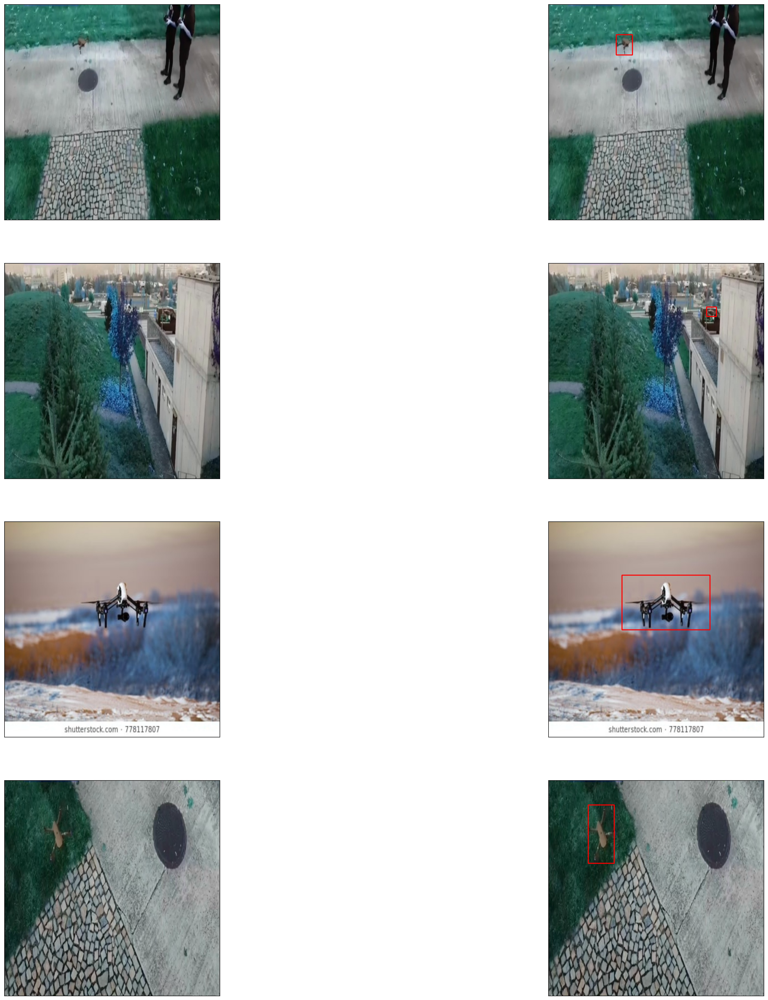

In [58]:
plt.figure(figsize=(30,30))
for i in range(1,8,2):
    k=random.randint(0, len(imgtrain_list)-1)
    img_path=os.path.join(imgtrainpath, imgtrain_list[k])
    label_path=os.path.join(labeltrainpath, labeltrain_list[k])
    bbox=get_bbox_from_label(label_path)
    image=cv2.imread(img_path)
    image_copy=copy.deepcopy(image)
    ax=plt.subplot(4, 2, i)
    plt.imshow(image) # displaying image
    plt.xticks([])
    plt.yticks([])
    cv2.drawContours(image_copy, bbox, -1, red, 2) # drawing bounding box on copy of image
    ax=plt.subplot(4, 2, i+1)
    plt.imshow(image_copy) # displaying image with bounding box
    plt.xticks([])
    plt.yticks([])

In [59]:
!pip install ultralytics

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 644.5/644.5 kB 17.6 MB/s eta 0:00:0000:01


In [60]:
from ultralytics import YOLO

In [61]:
model=YOLO('yolov8n.yaml').load('yolov8n.pt')


                   from  n    params  module                                       arguments                     
  0                  -1  1       464  ultralytics.nn.modules.conv.Conv             [3, 16, 3, 2]                 
  1                  -1  1      4672  ultralytics.nn.modules.conv.Conv             [16, 32, 3, 2]                
  2                  -1  1      7360  ultralytics.nn.modules.block.C2f             [32, 32, 1, True]             
  3                  -1  1     18560  ultralytics.nn.modules.conv.Conv             [32, 64, 3, 2]                
  4                  -1  2     49664  ultralytics.nn.modules.block.C2f             [64, 64, 2, True]             
  5                  -1  1     73984  ultralytics.nn.modules.conv.Conv             [64, 128, 3, 2]               
  6                  -1  2    197632  ultralytics.nn.modules.block.C2f             [128, 128, 2, True]           
  7                  -1  1    295424  ultralytics.nn.modules.conv.Conv             [128

In [62]:
results=model.train(data=config_path, epochs=100, resume=True, iou=0.5, conf=0.001)

Ultralytics YOLOv8.0.199 🚀 Python-3.10.12 torch-2.0.0 CUDA:0 (Tesla P100-PCIE-16GB, 16281MiB)
engine/trainer: task=detect, mode=train, model=yolov8n.yaml, data=/kaggle/working/config.yaml, epochs=100, patience=50, batch=16, imgsz=640, save=True, save_period=-1, cache=False, device=None, workers=8, project=None, name=train, exist_ok=False, pretrained=True, optimizer=auto, verbose=True, seed=0, deterministic=True, single_cls=False, rect=False, cos_lr=False, close_mosaic=10, resume=None, amp=True, fraction=1.0, profile=False, freeze=None, overlap_mask=True, mask_ratio=4, dropout=0.0, val=True, split=val, save_json=False, save_hybrid=False, conf=0.001, iou=0.5, max_det=300, half=False, dnn=False, plots=True, source=None, show=False, save_txt=False, save_conf=False, save_crop=False, show_labels=True, show_conf=True, vid_stride=1, stream_buffer=False, line_width=None, visualize=False, augment=False, agnostic_nms=False, classes=None, retina_masks=False, boxes=True, format=torchscript, keras=F

Freezing layer 'model.22.dfl.conv.weight'
AMP: running Automatic Mixed Precision (AMP) checks with YOLOv8n...
AMP: checks passed ✅
train: Scanning /kaggle/working/labels/train... 6816 images, 650 backgrounds, 0 corrupt: 100%|██████████| 6816/6816 [00:03<00:00, 2125.48it/s]
train: New cache created: /kaggle/working/labels/train.cache
albumentations: Blur(p=0.01, blur_limit=(3, 7)), MedianBlur(p=0.01, blur_limit=(3, 7)), ToGray(p=0.01), CLAHE(p=0.01, clip_limit=(1, 4.0), tile_grid_size=(8, 8))
val: Scanning /kaggle/working/labels/validation... 852 images, 0 backgrounds, 0 corrupt: 100%|██████████| 852/852 [00:00<00:00, 1452.22it/s]
val: New cache created: /kaggle/working/labels/validation.cache
Plotting labels to runs/detect/train/labels.jpg... 
optimizer: 'optimizer=auto' found, ignoring 'lr0=0.01' and 'momentum=0.937' and determining best 'optimizer', 'lr0' and 'momentum' automatically... 
optimizer: SGD(lr=0.01, momentum=0.9) with parameter groups 57 weight(decay=0.0), 64 weight(decay

lr/pg0,▃████▇▇▇▇▇▆▆▆▆▆▆▅▅▅▅▅▄▄▄▄▄▃▃▃▃▃▃▂▂▂▂▂▁▁▁
lr/pg1,▃████▇▇▇▇▇▆▆▆▆▆▆▅▅▅▅▅▄▄▄▄▄▃▃▃▃▃▃▂▂▂▂▂▁▁▁
lr/pg2,▃████▇▇▇▇▇▆▆▆▆▆▆▅▅▅▅▅▄▄▄▄▄▃▃▃▃▃▃▂▂▂▂▂▁▁▁
metrics/mAP50(B),▄▁▄▇▇▇█▆▇█▆▆▇▇▇▆▅█▃▅▆▄▇▄▅▅▄▄▄▃▃▃▃▃▂▃▃▂▂█
metrics/mAP50-95(B),▅▁▄▇▆▇▆▅▆▇▆▅▇▆▆▆▅█▃▄▅▄▆▃▅▅▄▄▄▃▃▃▃▃▂▃▂▂▂█
metrics/precision(B),▄▁▃▇▇▇█▅▇▇▆▆▇▇▆▆▆█▂▅▆▅▇▄▆▆▄▅▅▄▄▄▄▄▃▄▄▃▃█
metrics/recall(B),▃▁▄▆▇▇▇▅▇█▅▅▇▇▇▆▅█▂▄▅▄▇▃▅▅▃▄▄▂▂▂▃▃▂▃▂▁▁█
model/GFLOPs,▁
model/parameters,▁
model/speed_PyTorch(ms),▁
train/box_loss,▆██▇▇▆▆▅▅▅▅▅▅▄▄▄▄▄▃▃▃▃▃▃▃▃▂▂▂▂▂▂▂▂▂▁▁▁▁▁


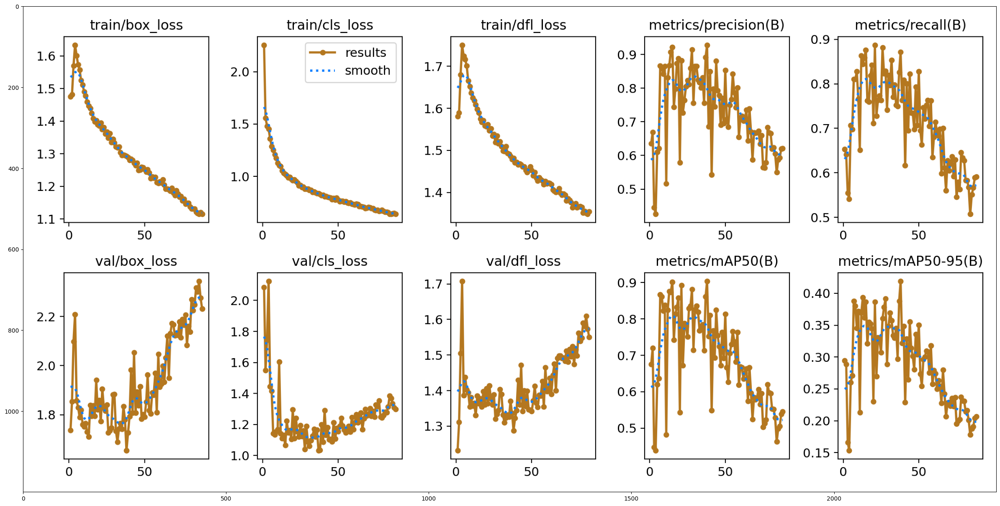

In [63]:
plt.figure(figsize=(30,30))
trainingresult_path=os.path.join(curr_path, 'runs', 'detect', 'train')
results_png=cv2.imread(os.path.join(trainingresult_path,'results.png'))
plt.imshow(results_png)

In [64]:
# function for evaluating model metrics map50
def evaluate_map50(trainedmodel, data_path, dataset='val'):
    metrics=trainedmodel.val(data=data_path, split=dataset)
    map50=round(metrics.box.map50, 3)
    print("The mAP of model on {0} dataset is {1}".format(dataset,map50))
    return metrics, map50

In [65]:
# function for displaying plots created by YOLO
def display_curves(root_path):
    plt.figure(figsize=(50,50))
    
    #displaying p curve
    p_curve=cv2.imread(os.path.join(root_path,'P_curve.png'))
    ax=plt.subplot(5,1,1)
    plt.imshow(p_curve)
    
    #displaying r curve
    r_curve=cv2.imread(os.path.join(root_path,'R_curve.png'))
    ax=plt.subplot(5,1,2)
    plt.imshow(r_curve)
    
    #displaying pr curve
    pr_curve=cv2.imread(os.path.join(root_path,'PR_curve.png'))
    ax=plt.subplot(5,1,3)
    plt.imshow(pr_curve)
    
    #displaying f1 curve
    f1_curve=cv2.imread(os.path.join(root_path,'F1_curve.png'))
    ax=plt.subplot(5,1,4)
    plt.imshow(f1_curve)
    
    #displaying confusion matrix
    confusion_matrix=cv2.imread(os.path.join(root_path,'confusion_matrix.png'))
    ax=plt.subplot(5,1,5)
    plt.imshow(confusion_matrix)

In [85]:
train_metrics, train_map50=evaluate_map50(model, config_path, dataset='train')

Ultralytics YOLOv8.0.199 🚀 Python-3.10.12 torch-2.0.0 CUDA:0 (Tesla P100-PCIE-16GB, 16281MiB)
val: Scanning /kaggle/working/labels/train.cache... 6816 images, 650 backgrounds, 0 corrupt: 100%|██████████| 6816/6816 [00:00<?, ?it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 426/426 [01:08<00:00,  6.25it/s]
                   all       6816       6362      0.958      0.947      0.975      0.623
Speed: 0.3ms preprocess, 2.2ms inference, 0.0ms loss, 1.3ms postprocess per image
Results saved to runs/detect/train5


The mAP of model on train dataset is 0.975


In [86]:
train_path=os.path.join(curr_path, 'runs', 'detect', 'train')

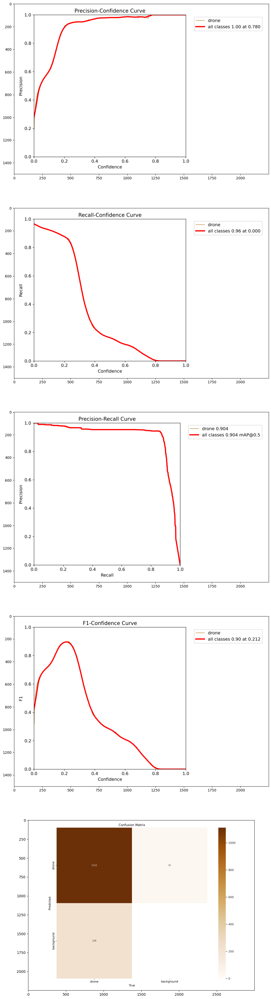

In [87]:
display_curves(train_path)

In [79]:
val_metrics, val_map50=evaluate_map50(model, config_path, dataset='val')

Ultralytics YOLOv8.0.199 🚀 Python-3.10.12 torch-2.0.0 CUDA:0 (Tesla P100-PCIE-16GB, 16281MiB)
val: Scanning /kaggle/working/labels/validation.cache... 852 images, 0 backgrounds, 0 corrupt: 100%|██████████| 852/852 [00:00<?, ?it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 54/54 [00:09<00:00,  5.55it/s]
                   all        852       1340       0.93      0.873      0.907      0.419
Speed: 1.0ms preprocess, 2.4ms inference, 0.0ms loss, 1.7ms postprocess per image
Results saved to runs/detect/train3


The mAP of model on val dataset is 0.907



image 1/1 /kaggle/working/images/test/08312.jpg: 640x640 1 drone, 5.5ms
Speed: 1.5ms preprocess, 5.5ms inference, 1.8ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /kaggle/working/images/test/08431.jpg: 640x640 (no detections), 6.0ms
Speed: 1.5ms preprocess, 6.0ms inference, 1.0ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /kaggle/working/images/test/08084.jpg: 640x640 1 drone, 5.6ms
Speed: 1.4ms preprocess, 5.6ms inference, 1.6ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /kaggle/working/images/test/07707.jpg: 640x640 1 drone, 5.4ms
Speed: 2.8ms preprocess, 5.4ms inference, 1.5ms postprocess per image at shape (1, 3, 640, 640)


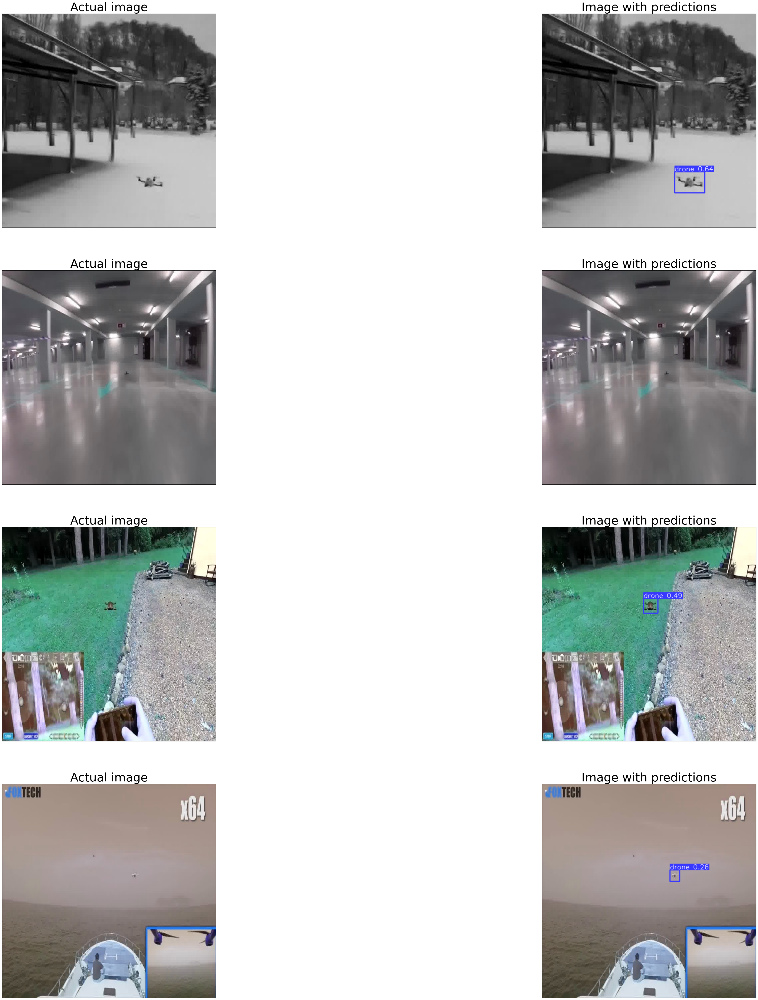

In [69]:
plt.figure(figsize=(60,60))
m=random.randint(0, 150) # Selecting random image number
for i in range(1,8,2):
    test_image=os.path.join(imgtestpath, os.listdir(imgtestpath)[m])
    ax=plt.subplot(4,2,i)
    
    # Display actual image
    plt.imshow(cv2.imread(test_image)) 
    plt.xticks([])
    plt.yticks([])
    plt.title("Actual image", fontsize = 40)
    
    # Predict 
    res = model(test_image)
    res_plotted = res[0].plot()
    ax=plt.subplot(4,2,i+1)
    
    # Display image with predictions
    plt.imshow(res_plotted)
    plt.title("Image with predictions", fontsize = 40)
    plt.xticks([])
    plt.yticks([])
    m=m+1


image 1/1 /kaggle/working/images/test/08017.jpg: 640x640 1 drone, 10.7ms
Speed: 1.7ms preprocess, 10.7ms inference, 2.6ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /kaggle/working/images/test/08211.jpg: 640x640 1 drone, 5.5ms
Speed: 1.4ms preprocess, 5.5ms inference, 1.5ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /kaggle/working/images/test/08183.jpg: 640x640 1 drone, 5.5ms
Speed: 2.5ms preprocess, 5.5ms inference, 1.5ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /kaggle/working/images/test/08466.jpg: 640x640 1 drone, 5.7ms
Speed: 1.5ms preprocess, 5.7ms inference, 1.5ms postprocess per image at shape (1, 3, 640, 640)


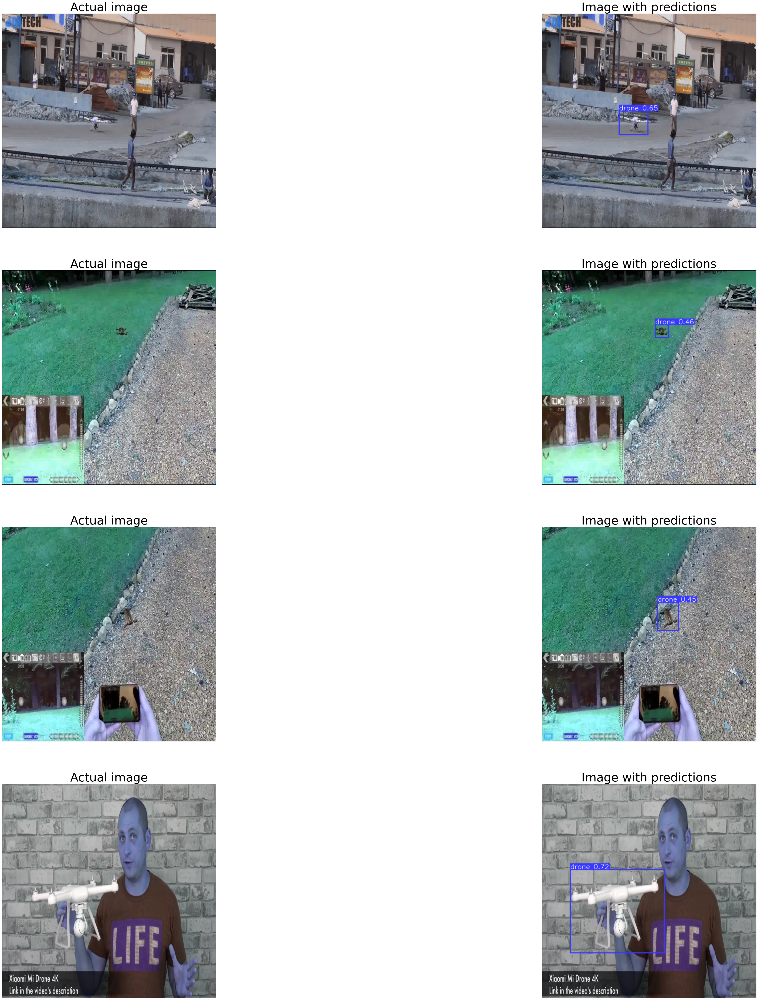

In [70]:
plt.figure(figsize=(60,60))
m=random.randint(0, 150) # Selecting random image number
for i in range(1,8,2):
    test_image=os.path.join(imgtestpath, os.listdir(imgtestpath)[m])
    ax=plt.subplot(4,2,i)
    
    # Display actual image
    plt.imshow(cv2.imread(test_image)) 
    plt.xticks([])
    plt.yticks([])
    plt.title("Actual image", fontsize = 40)
    
    # Predict 
    res = model(test_image)
    res_plotted = res[0].plot()
    ax=plt.subplot(4,2,i+1)
    
    # Display image with predictions
    plt.imshow(res_plotted)
    plt.title("Image with predictions", fontsize = 40)
    plt.xticks([])
    plt.yticks([])
    m=m+1


image 1/1 /kaggle/working/images/test/08452.jpg: 640x640 1 drone, 6.1ms
Speed: 1.5ms preprocess, 6.1ms inference, 2.2ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /kaggle/working/images/test/07790.jpg: 640x640 1 drone, 6.1ms
Speed: 1.6ms preprocess, 6.1ms inference, 1.5ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /kaggle/working/images/test/08146.jpg: 640x640 (no detections), 6.1ms
Speed: 1.4ms preprocess, 6.1ms inference, 1.0ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /kaggle/working/images/test/07855.jpg: 640x640 2 drones, 6.1ms
Speed: 2.9ms preprocess, 6.1ms inference, 1.6ms postprocess per image at shape (1, 3, 640, 640)


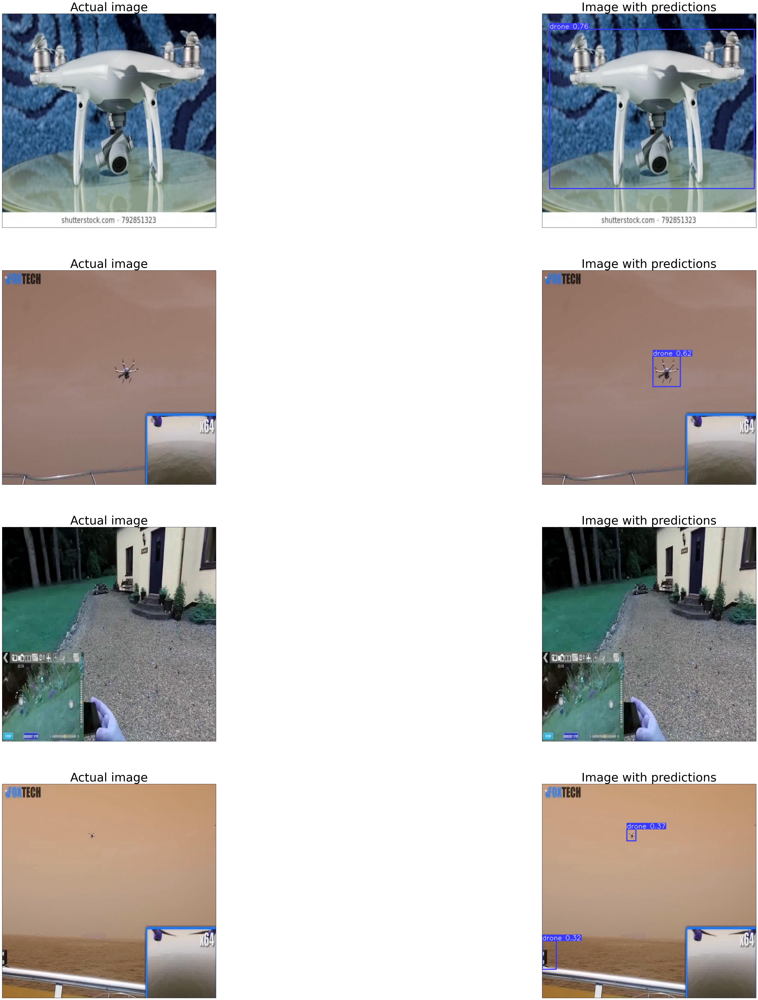

In [72]:
plt.figure(figsize=(60,60))
m=random.randint(0, 150) # Selecting random image number
for i in range(1,8,2):
    test_image=os.path.join(imgtestpath, os.listdir(imgtestpath)[m])
    ax=plt.subplot(4,2,i)
    
    # Display actual image
    plt.imshow(cv2.imread(test_image)) 
    plt.xticks([])
    plt.yticks([])
    plt.title("Actual image", fontsize = 40)
    
    # Predict 
    res = model(test_image)
    res_plotted = res[0].plot()
    ax=plt.subplot(4,2,i+1)
    
    # Display image with predictions
    plt.imshow(res_plotted)
    plt.title("Image with predictions", fontsize = 40)
    plt.xticks([])
    plt.yticks([])
    m=m+1